# **2.** Correct Spectral Baseline
***

## Table of Contents
* [**2.1** | Load and preprocess the laboratory spectra](#2.1---Load-and-preprocess-the-CH4-lab-spectrum)
* [**2.2** | Visualize spectrum](#2.2---Visualize-spectrum)
* [**2.3** | Correct Spectral Baseline](#2.3---Apply-baseline-correction)
    * [**2.3.1** | ALPLS Method](#2.3.1---ARPLS-method)
    * [**2.3.2** | ALS Method](#2.3.2---ALS-method)
    * [**2.3.3** | Compare The Corrected Baselines](#2.3.3---Compare-the-corrected-baselines)
* [**2.4** | Save the baseline corrected spectra](#2.4---Save-the-baseline-corrected-spectra)

## **2.0** - Why correct baseline?
* In spectroscopy, we need to be able to accurately interpret spectral data.
* A spectral *baseline* represents the level of signal where the sample absorbs no light, that ideally would be a straight line at zero.
* In reality, there is *baseline noise* caused by inherent noise in the instrument or sample scattering.
* Identifying and correcting a spectral baseline minimises the baseline noise, which is essential for *quantitative spectroscopy* -  when the height and area of spectral peaks are relevant to analysis. Without a flattened baseline, these values can be greatly under- or over-estimated.
* Most importantly, accurate qualitative spectroscopic analysis is crucial for comparison with other data sets.

**Key Objectives in this tutorial:**

1. Impliment the following algorithims to remove the baseline

2. Compare the corrected baseline togather to choose the top method

3. Visualize the results

In [1]:
# Import necessary modules
from Xpectra.SpecFitAnalyzer import *
from Xpectra.SpecStatVisualizer import plot_spectra_errorbar_bokeh, plot_compare_baselines

## **2.1** - Load and preprocess the CH4 lab spectrum

The laboratory spectrum has two columns: 
1. Wavenumber [$cm^{-1}$]
2. Signal (arbitrary unit)

In [2]:
# Call environment variable and assign path to data
__reference_data_path__ = os.getenv("Xpectra_reference_data")

# Import methane spectrum
methane_spectrum = pd.read_csv(os.path.join(__reference_data_path__, 'datasets','Spectrum_CH4_100Torr.csv'))

x = 10**7/methane_spectrum['W'].to_numpy() # Convert wavelength to wavenumber
y = methane_spectrum['I'].to_numpy() # Intensity

$\rightarrow$ First, we instantiate the class with our wavenumber and signal arrays, as well as the reference data path.  

In [3]:
# Initialize SpecFitAnalyzer
specfit = SpecFitAnalyzer(wavenumber_values= x,
                          signal_values = y,
                          absorber_name = 'CH4',
                          __reference_data__ = __reference_data_path__)

In [4]:
# Check for NAN or negative values and update x and y with trimmed arrays
specfit.check_negative_nan()

No NAN values.
9614 negative values found (7.78% of data)


In [5]:
# Convert to absorption
y = np.exp(-y)

In [6]:
# Update instance
specfit.signal_values = y

## **2.2** - Visualize spectrum

$\rightarrow$ Plot spectrum interactively using Bokeh

In [7]:
plot_spectra_errorbar_bokeh(wavenumber_values = x,
                            signal_values = y,
                            absorber_name = 'CH4',
                            plot_type = 'line')

Loading BokehJS ...

## **2.3** - Apply baseline correction

Xpectra.SpecFitAnalyzer module has 3 essential purposes: process spectral data (completed), fit and correct spectral baseline (current), and identify and fit spectral peaks. 

At this step, we use functions to model the shape of the baseline. Once we derive the fitted baseline, we can subtract it from the signal to create a baseline-corrected signal. 

### **2.3.1** - ARPLS method

$\rightarrow$ Run ARPLS baseline correction, visualize the plot, and save the plot as a pdf

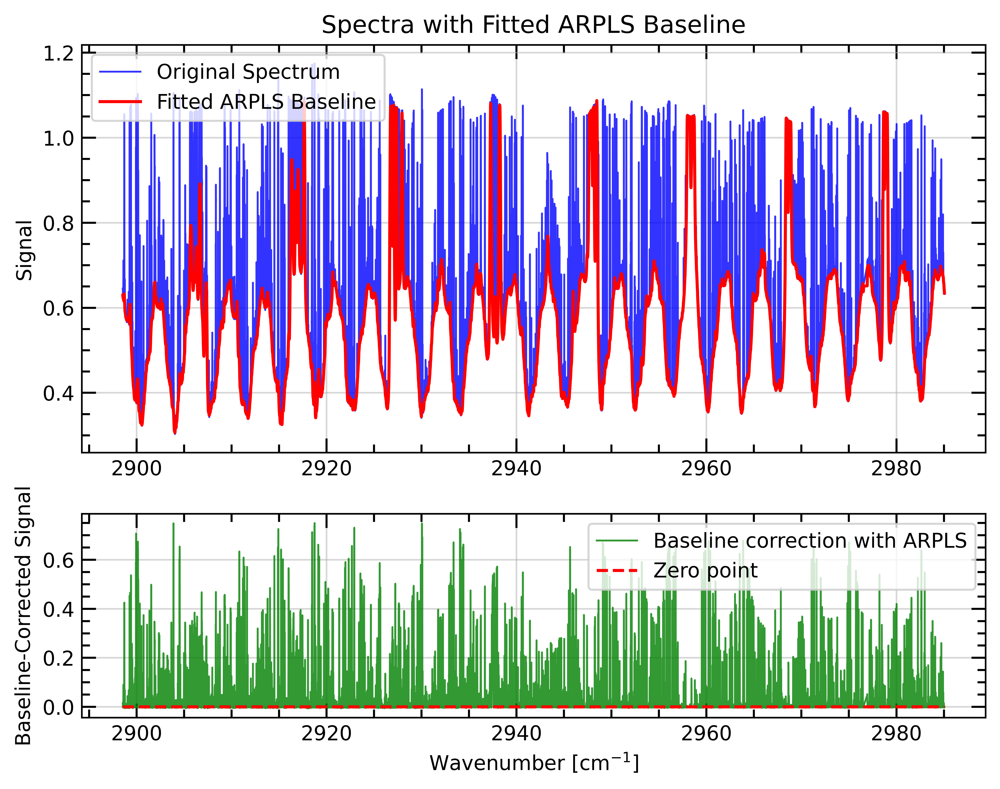

Fitting parameters...
Metrics...


In [8]:
# Fit baseline using ARPLS algorythm
specfit.arpls(__plot__ = True,
              __save_plots__ = True,
              __print__ = True)

In [9]:
specfit.baseline_type

'arpls'

### **2.3.2** - ALS method

$\rightarrow$ Do the same for ALS: Run ALS baseline correction, visualize the plot, and save the plot as a pdf

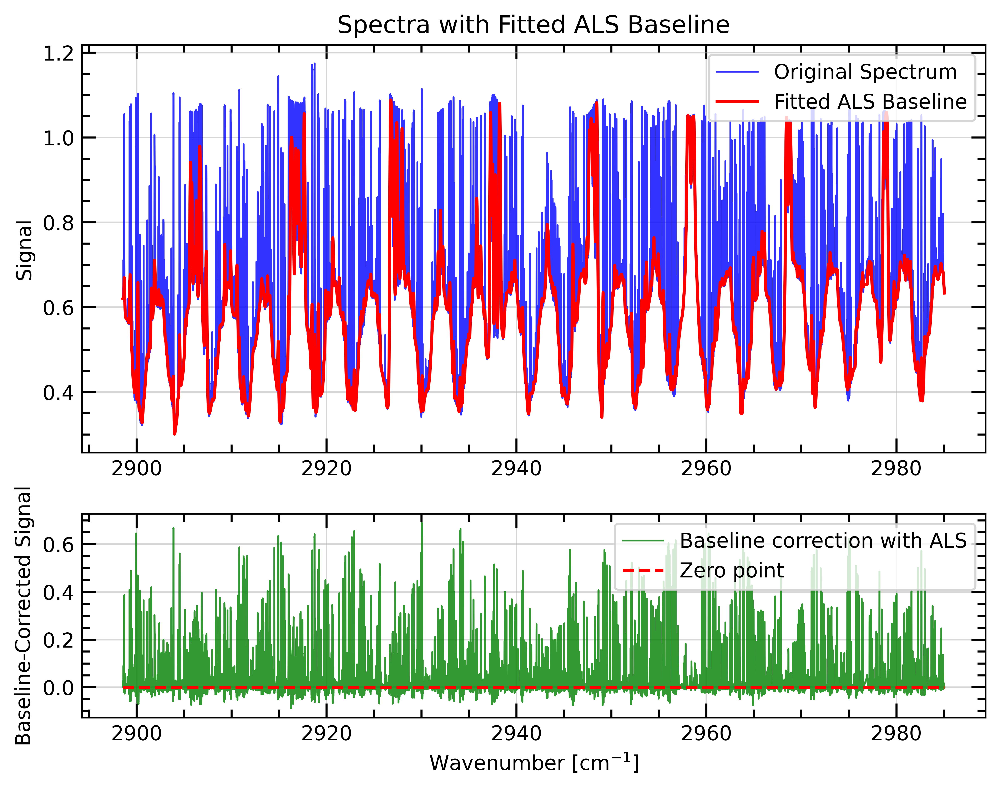

Fitting parameters...
Metrics...


In [10]:
# Fit baseline using ALS algorythm
specfit.als(__plot__ = True,
              __save_plots__ = True,
              __print__ = True)

In [11]:
specfit.baseline_type

'als'

### **2.3.3** - Compare the corrected baselines

$\rightarrow$ As a part of the fitting process, we determine which method models the baseline most effectively. 

$\rightarrow$ Let's perform qualitative analysis on the baseline-correction methods by overplotting the residuals from ARPLS and ALS methods. 

In [12]:
plot_compare_baselines(wavenumber_values = x,
                       corrected_signal_1 = specfit.y_baseline_corrected_ARPLS,
                       baseline_type_1 = 'ARPLS',
                       corrected_signal_2 = specfit.y_baseline_corrected_ALS,
                       baseline_type_2 = 'ALS'
                      )

Loading BokehJS ...

$\rightarrow$ In this case, ARPLS has a cleaner zero point after baseline subtraction, so we choose this as the baseline-correction method. Let's update the class with our choice:

In [13]:
# Define the best baseline corrected output
specfit.y_baseline_corrected = specfit.y_baseline_corrected_ARPLS

# Update chosen baseline type
specfit.baseline_type = 'ARPLS'

## **2.4** - Save the baseline corrected spectra

$\rightarrow$ Create DataFrame with original data, processed data, and baseline-corrected data

In [14]:
# Create DataFrame
data = {
    'original_x': x,
    'original_y': y,
    'cleaned_x': specfit.x_cleaned,
    'cleaned_y': specfit.y_cleaned,
    'baseline_corrected_x': x,
    'baseline_corrected_y': specfit.y_baseline_corrected,
}

df = pd.DataFrame.from_dict(data, orient='index').transpose()

In [15]:
display(df)

,original_x,original_y,cleaned_x,cleaned_y,baseline_corrected_x,baseline_corrected_y
0,2898.543060,0.643845,2898.543060,0.440297,2898.543060,0.014491
1,2898.543908,0.646336,2898.543908,0.436436,2898.543908,0.017204
2,2898.544766,0.645778,2898.544766,0.437300,2898.544766,0.016869
3,2898.545133,0.639101,2898.545133,0.447693,2898.545133,0.010415
4,2898.545638,0.630384,2898.545638,0.461426,2898.545638,0.001921
...,...,...,...,...,...,...
123522,2985.057227,0.635260,NaN,NaN,2985.057227,-0.000147
123523,2985.058132,0.635798,NaN,NaN,2985.058132,0.000649
123524,2985.058876,0.633810,NaN,NaN,2985.058876,-0.001080
123525,2985.059515,0.632179,NaN,NaN,2985.059515,-0.002451


$\rightarrow$ Save the spectra to CSV file

In [16]:
# Define file name
file_name = f"{specfit.baseline_type.lower()}_baseline_corrected_methane_spectrum.csv"

# Save DataFrame to CSV
df.to_csv(os.path.join(__reference_data_path__,'processed_data',file_name), index=False)